In [3]:
import os
import h5py
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, resample_poly
import neurokit2 as nk
from scipy.signal import find_peaks
import seaborn as sns
from scipy.stats import wilcoxon
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, resample_poly, welch


# Pandas display settings (optional)
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", 0)

In [4]:
RI1_3_6_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s3_6_p5_3_nRB3_20250621_125312_merged.h5"
RI2_3_6_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s3_6_p5_3_nRB3_20250621_131158_merged.h5"
BLRI_s3_6_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\BLRI_s3_6_p5_3_nRB3_20250621_123634_merged.h5"
BLRI_s4_7_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\BLRI_s4_7_p5_2_nRB3_20250621_144806_merged.h5"
RI1_4_7_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s4_7_p5_2_nRB3_20250621_150707_merged.h5"
RI2_4_7_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s4_7_p5_2_nRB3_20250621_152519_merged.h5"
RI1_2_3_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s2_3_p5_3_nRB3_20250622_104059_merged (1).h5"
RI2_2_3_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s2_3_p5_3_nRB3_20250622_110216_merged.h5"
RI1_4_8_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s4_8_p5_1_nRB3_20250621_165214_merged.h5"
RI2_4_8_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s4_8_p5_1_nRB3_20250621_171318_merged.h5"
RI1_1_1_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s1_1_p5_2_nRB6_20250622_143958_merged.h5"
RI2_1_1_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s1_1_p5_2_nRB6_20250622_150457_merged.h5"
RI1_1_2_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s1_2_p5_1_nRB6_20250622_170742_merged.h5"
RI2_1_2_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s1_2_p5_1_nRB6_20250622_173049_merged.h5"
RI1_2_4_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s2_4_p5_4_nRB3_20250622_123424_merged.h5"
RI2_2_4_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s2_4_p5_4_nRB3_20250622_125648_merged.h5"
RI2_3_5_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI2_s3_5_p5_4_nRB3_20250621_112618_merged.h5"
RI1_3_5_h5_path = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s3_5_p5_4_nRB3_20250621_105014_merged.h5"

ri1_h5_paths = {
    "RI1_3_6": RI1_3_6_h5_path,
    "RI1_4_7": RI1_4_7_h5_path,  
    "RI1_2_3": RI1_2_3_h5_path,
    "RI1_4_8": RI1_4_8_h5_path,
    "RI1_1_1": RI1_1_1_h5_path,
    "RI1_1_2": RI1_1_2_h5_path,
    "RI1_2_4": RI1_2_4_h5_path,
    "RI1_3_5": RI1_3_5_h5_path,
}

ri2_h5_paths = {
    "RI2_3_6": RI2_3_6_h5_path,
    "RI2_4_7": RI2_4_7_h5_path,
    "RI2_2_3": RI2_2_3_h5_path,
    "RI2_4_8": RI2_4_8_h5_path,
    "RI2_1_1": RI2_1_1_h5_path,
    "RI2_1_2": RI2_1_2_h5_path,
    "RI2_2_4": RI2_2_4_h5_path,
    "RI2_3_5": RI2_3_5_h5_path,
}


In [5]:
# Choose one by key
key = "RI1_3_6"   # change to whichever you want to test
h5_file = ri1_h5_paths[key]

print("Using:", h5_file)
print("Exists?", os.path.exists(h5_file))


Using: E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s3_6_p5_3_nRB3_20250621_125312_merged.h5
Exists? True


In [6]:
with h5py.File(h5_file, 'r') as f:
    print("Top-level keys:", list(f.keys()))


Top-level keys: ['ekg', 'ekg_metadata', 'metadata', 'resp', 'resp_metadata']


In [7]:
with h5py.File(h5_file, 'r') as f:
    # Try common places for fs
    fs = None

    # resp dataset attrs?
    if 'resp' in f:
        print("resp attrs:", dict(f['resp'].attrs))
        for k in ['sampling_rate','fs','rate','Fs','FS']:
            if k in f['resp'].attrs:
                fs = float(f['resp'].attrs[k])

    # metadata groups?
    for grp in ['resp_metadata','ekg_metadata','metadata','info']:
        if grp in f:
            print(f"{grp} attrs:", dict(f[grp].attrs))
            # fs directly?
            for k in ['sampling_rate','fs','rate','Fs','FS']:
                if k in f[grp].attrs and fs is None:
                    fs = float(f[grp].attrs[k])
            # or via duration
            if fs is None and 'duration_sec' in f[grp].attrs and 'resp' in f:
                dur = float(f[grp].attrs['duration_sec'])
                if dur > 0:
                    resp_len = len(f['resp'][:])
                    fs = resp_len / dur

print("Detected fs:", fs)


resp attrs: {}
resp_metadata attrs: {}
ekg_metadata attrs: {'channel_id': '21', 'duration_sec': 603.2723, 'num_samples': 12065446, 'sampling_frequency': 20000.0, 'stream_id': 'trodes'}
metadata attrs: {'date': '2025-06-21', 'negative_agent_id': 'RB3', 'positive_agent_id': '5.3', 'subject_id': '3.6', 'time': '12:53:12', 'trial_type': 'RI1'}
Detected fs: 20000.0


In [8]:
with h5py.File(h5_file, 'r') as f:
    resp = f['resp'][:].astype(float).flatten()

fs = 20000.0  # from ekg_metadata.sampling_frequency
dur_from_len = len(resp) / fs
print("len(resp):", len(resp))
print("fs (Hz):", fs)
print("duration from length (s):", dur_from_len)


len(resp): 12065446
fs (Hz): 20000.0
duration from length (s): 603.2723


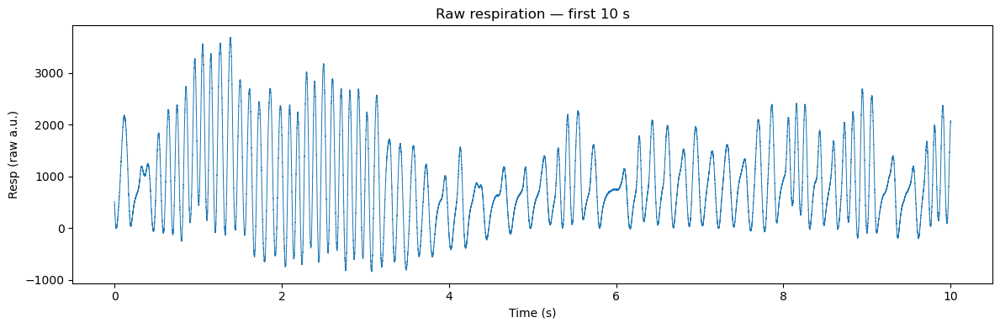

In [10]:
T = 10  # seconds
N = int(min(len(resp), fs*T))
t = np.arange(N) / fs

plt.figure(figsize=(12,4))
plt.plot(t, resp[:N], lw=0.7)
plt.xlabel("Time (s)")
plt.ylabel("Resp (raw a.u.)")
plt.title("Raw respiration — first 10 s")
plt.tight_layout()
plt.show()


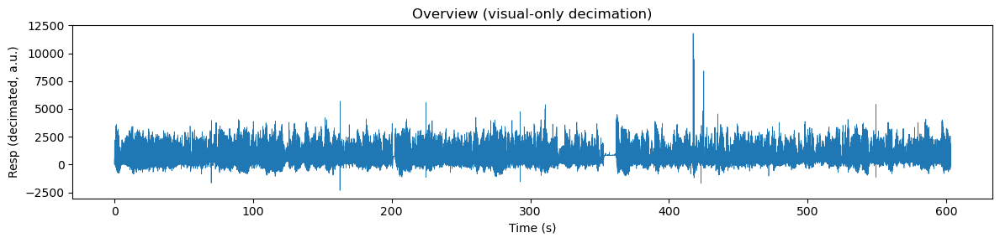

In [11]:
step = int(fs // 50)  # ~50 Hz view; for visualization ONLY
vis = resp[::step]
t_vis = np.arange(len(vis)) * (step / fs)

plt.figure(figsize=(12,3))
plt.plot(t_vis, vis, lw=0.5)
plt.xlabel("Time (s)")
plt.ylabel("Resp (decimated, a.u.)")
plt.title("Overview (visual-only decimation)")
plt.tight_layout()
plt.show()


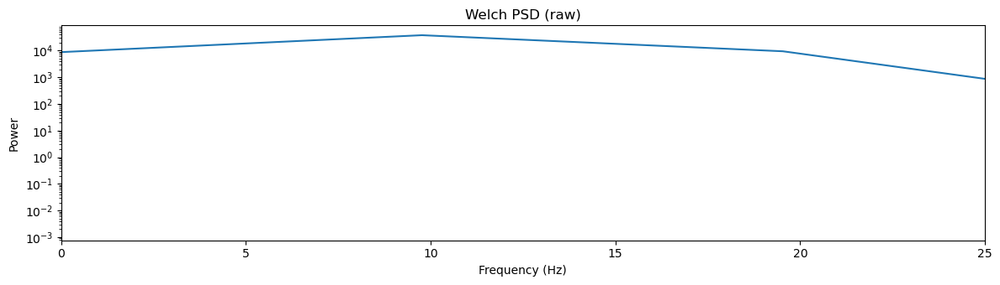

In [12]:
f_w, pxx = welch(resp, fs=fs, nperseg=min(2048, len(resp)))
plt.figure(figsize=(12,3.5))
plt.semilogy(f_w, pxx)
plt.xlim(0, 25)  # mouse resp/sniff usually <~15 Hz
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power")
plt.title("Welch PSD (raw)")
plt.tight_layout()
plt.show()


In [13]:
from scipy.signal import butter, filtfilt, resample_poly

# 1) Anti-alias lowpass @ 40 Hz (new Nyquist will be 50 Hz after DS to 100 Hz)
b_lp, a_lp = butter(N=4, Wn=40.0/(fs/2), btype='low')
resp_aa = filtfilt(b_lp, a_lp, resp)

# 2) Downsample 20000 Hz -> 100 Hz
down = int(fs // 100)  # = 200
resp_ds = resample_poly(resp_aa, up=1, down=down)
fs_ds = fs / down  # 100.0

# 3) Bandpass 0.5–15 Hz on the downsampled signal
b_bp, a_bp = butter(N=4, Wn=[0.5/(fs_ds/2), 15.0/(fs_ds/2)], btype='bandpass')
resp_f = filtfilt(b_bp, a_bp, resp_ds)

print("Original fs:", fs, "-> Downsampled fs:", fs_ds)
print("Lengths:", len(resp), "->", len(resp_f))


Original fs: 20000.0 -> Downsampled fs: 100.0
Lengths: 12065446 -> 60328


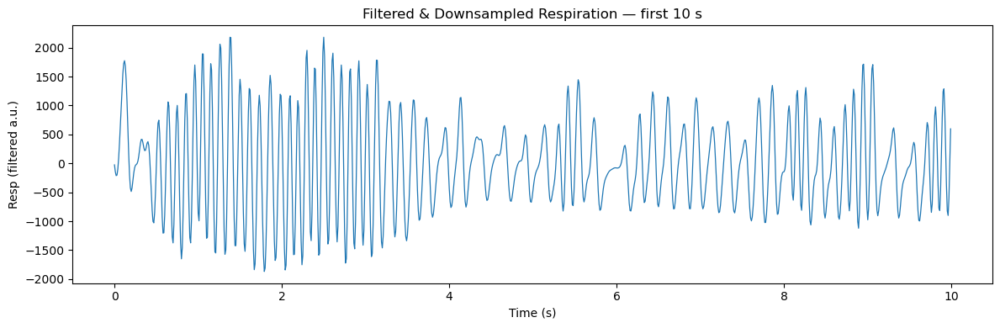

In [14]:
T = 10
N = int(min(len(resp_f), fs_ds*T))
t_ds = np.arange(N) / fs_ds

plt.figure(figsize=(12,4))
plt.plot(t_ds, resp_f[:N], lw=0.9)
plt.xlabel("Time (s)")
plt.ylabel("Resp (filtered a.u.)")
plt.title("Filtered & Downsampled Respiration — first 10 s")
plt.tight_layout()
plt.show()


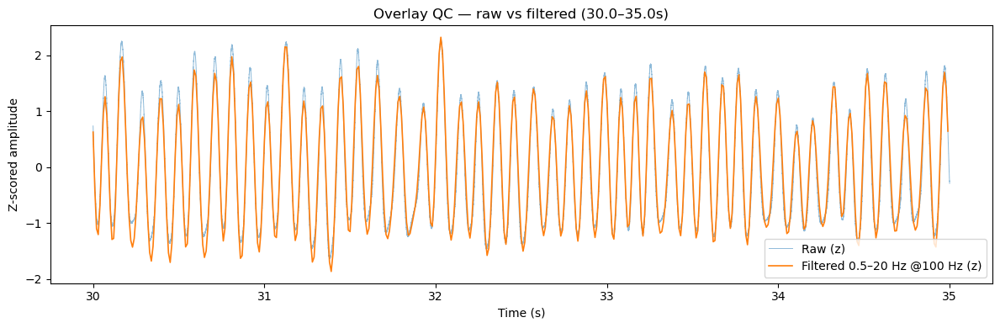

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# choose a clean segment
seg_start_s = 30.0
seg_dur_s   = 5.0

# indices in raw (20 kHz)
i0_raw = int(seg_start_s * fs)
i1_raw = int((seg_start_s + seg_dur_s) * fs)

# indices in filtered (100 Hz)
i0_ds = int(seg_start_s * fs_ds)
i1_ds = int((seg_start_s + seg_dur_s) * fs_ds)

# time vectors
t_raw = np.arange(i0_raw, i1_raw) / fs
t_flt = np.arange(i0_ds,  i1_ds)  / fs_ds

# grab segments
x_raw = resp[i0_raw:i1_raw].astype(float)
x_flt = resp_f[i0_ds:i1_ds].astype(float)

# z-score each segment (so amplitudes are comparable)
def zscore(x):
    return (x - np.mean(x)) / (np.std(x) + 1e-12)
x_raw_z = zscore(x_raw)
x_flt_z = zscore(x_flt)

plt.figure(figsize=(12,4))
plt.plot(t_raw, x_raw_z, alpha=0.5, lw=0.7, label="Raw (z)")
plt.plot(t_flt, x_flt_z, lw=1.2, label="Filtered 0.5–20 Hz @100 Hz (z)")
plt.xlabel("Time (s)")
plt.ylabel("Z-scored amplitude")
plt.title(f"Overlay QC — raw vs filtered ({seg_start_s}–{seg_start_s+seg_dur_s}s)")
plt.legend()
plt.tight_layout()
plt.show()


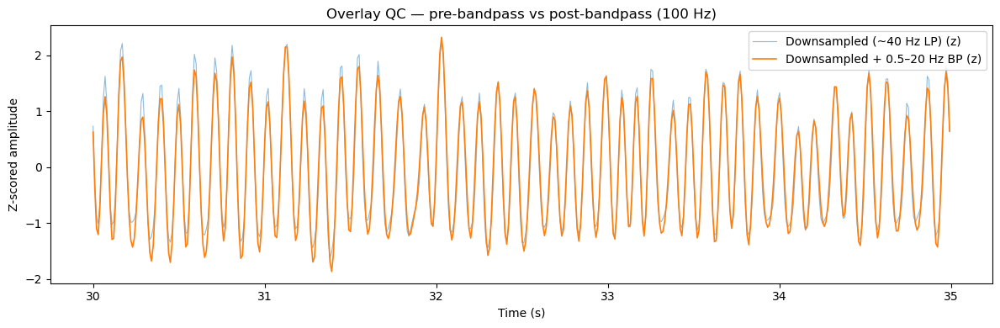

In [18]:
# If you want to see only the effect of the bandpass on the downsampled signal:
x_ds   = resp_ds[i0_ds:i1_ds].astype(float)   # AA lowpass + downsampled
x_filt = resp_f[i0_ds:i1_ds].astype(float)    # + bandpass

x_ds_z   = zscore(x_ds)
x_filt_z = zscore(x_filt)

t_seg = np.arange(i0_ds, i1_ds) / fs_ds

plt.figure(figsize=(12,4))
plt.plot(t_seg, x_ds_z,  alpha=0.5, lw=0.8, label="Downsampled (~40 Hz LP) (z)")
plt.plot(t_seg, x_filt_z, lw=1.2, label="Downsampled + 0.5–20 Hz BP (z)")
plt.xlabel("Time (s)")
plt.ylabel("Z-scored amplitude")
plt.title("Overlay QC — pre-bandpass vs post-bandpass (100 Hz)")
plt.legend()
plt.tight_layout()
plt.show()


In [19]:
from scipy.signal import find_peaks
import numpy as np

sig = resp_f           # filtered & downsampled signal from Step F
Fs  = fs_ds            # 100.0

# Physiological constraints
min_ibi_s = 1/20.0     # 0.05 s  = 20 Hz upper bound (very fast sniff)
max_ibi_s = 2.0        # 2.0 s   = 0.5 Hz lower bound (very slow breath)

# Peak finder settings (tweak if under/over-detecting)
min_distance = int(Fs * 0.06)                  # ≥60 ms between breaths (~≤16.7 Hz)
prominence   = np.std(sig) * 0.5               # require some amplitude

# Detect troughs (peaks on the inverted signal)
trough_idx, props = find_peaks(-sig, distance=min_distance, prominence=prominence)

print("Detected troughs:", len(trough_idx))


Detected troughs: 4260


In [20]:
# assumes: trough_idx (from find_peaks on -resp_f), Fs = fs_ds = 100.0
import numpy as np

ibi_s = np.diff(trough_idx) / Fs
print("IBI secs  [min, p5, p25, median, p75, p95, max]:",
      [float(x) for x in np.nanpercentile(ibi_s, [0,5,25,50,75,95,100])])

rate_hz = 1.0 / ibi_s
print("Rate Hz   [min, p5, p25, median, p75, p95, max]:",
      [float(x) for x in np.nanpercentile(rate_hz, [0,5,25,50,75,95,100])])

# fraction of implausible IBIs
too_short = (ibi_s < 0.06).mean()  # > ~16.7 Hz
too_long  = (ibi_s > 2.0).mean()   # < 0.5 Hz
print(f"Fraction IBI < 0.06 s: {too_short:.3%}   |   IBI > 2.0 s: {too_long:.3%}")


IBI secs  [min, p5, p25, median, p75, p95, max]: [0.07, 0.09, 0.1, 0.11, 0.15, 0.28, 9.31]
Rate Hz   [min, p5, p25, median, p75, p95, max]: [0.10741138560687433, 3.571428571428571, 6.666666666666667, 9.090909090909092, 10.0, 11.11111111111111, 14.285714285714285]
Fraction IBI < 0.06 s: 0.000%   |   IBI > 2.0 s: 0.023%


In [21]:
from scipy.signal import find_peaks
import numpy as np

sig = resp_f
Fs  = fs_ds  # 100 Hz

def robust_std(x):
    med = np.median(x)
    return 1.4826 * np.median(np.abs(x - med))

# Stricter constraints
min_distance = int(Fs * 0.09)     # >= 90 ms between troughs (~<= 11.1 Hz)
prominence   = 0.5 * robust_std(sig)
min_width    = int(Fs * 0.03)     # >= 30 ms width at half-prominence

trough_idx2, props2 = find_peaks(-sig,
                                 distance=min_distance,
                                 prominence=prominence,
                                 width=min_width)

print("Old troughs:", len(trough_idx), "New troughs:", len(trough_idx2))


Old troughs: 4260 New troughs: 4183


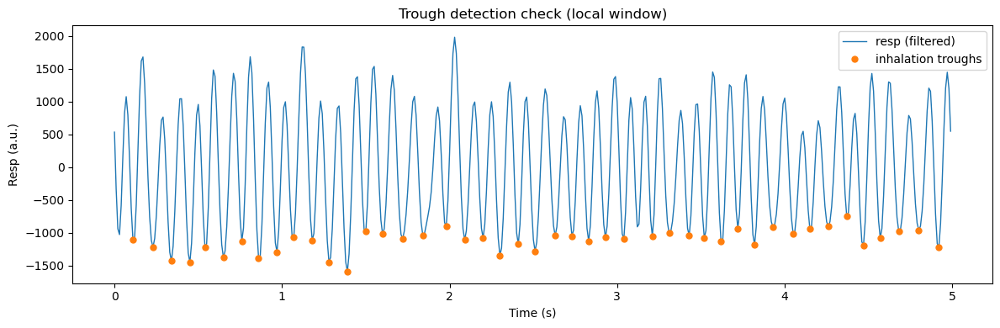

In [23]:
sig = resp_f
Fs  = fs_ds  # 100 Hz

seg_start_s = 30.0
seg_dur_s   = 5.0

i0 = int(seg_start_s * Fs)
i1 = min(int((seg_start_s + seg_dur_s) * Fs), len(sig))

# local time vector matches the slice length exactly
t_local = np.arange(i1 - i0) / Fs

plt.figure(figsize=(12,4))
plt.plot(t_local, sig[i0:i1], lw=1.0, label="resp (filtered)")

mask = (trough_idx2 >= i0) & (trough_idx2 < i1)
plt.plot((trough_idx2[mask] - i0) / Fs, sig[trough_idx2[mask]], 'o', ms=5, label="inhalation troughs")

plt.xlabel("Time (s)")
plt.ylabel("Resp (a.u.)")
plt.title("Trough detection check (local window)")
plt.legend()
plt.tight_layout()
plt.show()


In [25]:
ibi_s2 = np.diff(trough_idx2) / Fs
valid2 = (ibi_s2 >= 1/20) & (ibi_s2 <= 2.0)  # 0.05–2 s bounds
t_rate2 = (trough_idx2[1:][valid2]) / Fs
rate_hz2 = 1.0 / ibi_s2[valid2]

print("Breaths kept:", len(rate_hz2), "/", len(ibi_s2))
print("Rate Hz [p25, median, p75]:",
      np.percentile(rate_hz2, [25,50,75]).round(2))
print("Fraction > 6 Hz:", (rate_hz2>6).mean())


Breaths kept: 4181 / 4182
Rate Hz [p25, median, p75]: [ 6.67  8.33 10.  ]
Fraction > 6 Hz: 0.7955034680698397


Dominant freq Hz [p25, median, p75]: [7.5  8.75 9.5 ]


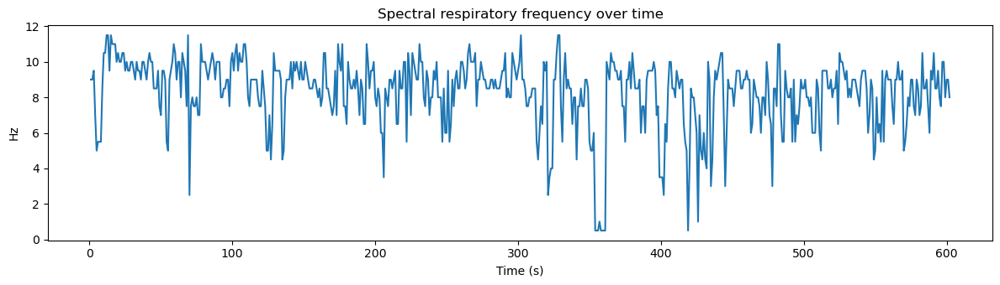

In [26]:
from scipy.signal import spectrogram
import numpy as np

# 2 s windows with 1 s overlap (smooth but responsive)
nper = int(Fs * 2.0)
nover = int(Fs * 1.0)
f, tt, Sxx = spectrogram(sig, fs=Fs, nperseg=nper, noverlap=nover,
                         scaling='density', mode='psd')

# Limit to 0.5–15 Hz band
band = (f >= 0.5) & (f <= 15.0)
f_band = f[band]
S_band = Sxx[band, :]

# Dominant frequency per window
peak_idx = np.argmax(S_band, axis=0)
dom_freq = f_band[peak_idx]  # Hz, per tt window

print("Dominant freq Hz [p25, median, p75]:",
      np.percentile(dom_freq, [25,50,75]).round(2))

# Plot spectral rate vs peak-based rate (1 s median)
plt.figure(figsize=(12,3.5))
plt.plot(tt, dom_freq, lw=1.5, label="PSD dominant freq (2s windows)")
plt.xlabel("Time (s)")
plt.ylabel("Hz")
plt.title("Spectral respiratory frequency over time")
plt.tight_layout()
plt.show()


count    11.000000
mean      8.561136
std       0.558623
min       7.692308
25%       8.333333
50%       8.333333
75%       9.090909
max       9.090909
dtype: float64


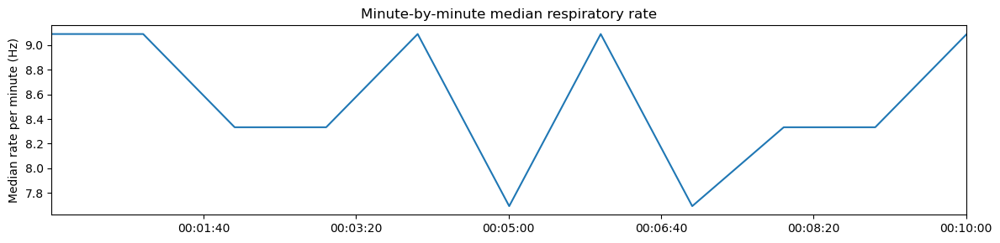

In [27]:
import pandas as pd
rate_series2 = pd.Series(rate_hz2, index=pd.to_timedelta(t_rate2, unit='s'))
per_min_median = rate_series2.resample('60s').median()

print(per_min_median.describe())
per_min_median.plot(figsize=(12,3), lw=1.5)
plt.ylabel("Median rate per minute (Hz)")
plt.title("Minute-by-minute median respiratory rate")
plt.tight_layout(); plt.show()


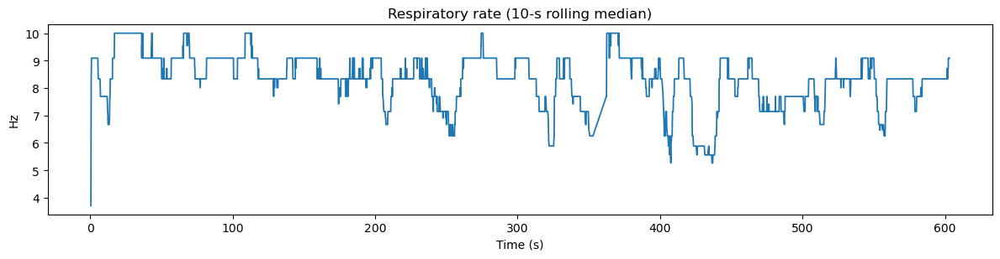

In [28]:
# uses the stricter detections: t_rate2 (s), rate_hz2 (Hz)
rate_s = pd.Series(rate_hz2, index=pd.to_timedelta(t_rate2, unit='s'))
rate10 = rate_s.rolling('10s', min_periods=1).median()

plt.figure(figsize=(12,3.2))
plt.plot(rate10.index.total_seconds(), rate10.values, lw=1.3)
plt.ylabel("Hz"); plt.xlabel("Time (s)")
plt.title("Respiratory rate (10-s rolling median)")
plt.tight_layout(); plt.show()


count    11.000000
mean      0.794329
std       0.072062
min       0.671875
25%       0.765316
50%       0.801471
75%       0.852481
max       0.894628
dtype: float64


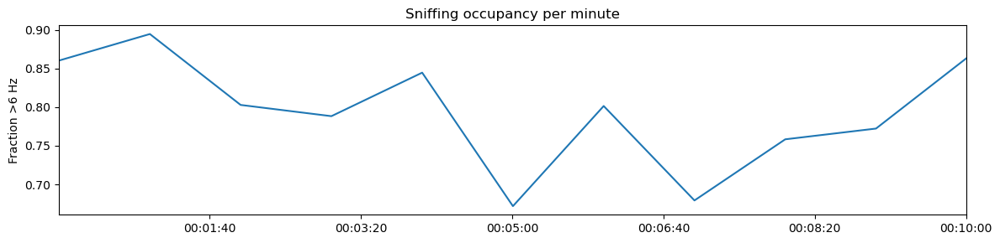

In [29]:
sniff_thresh = 6.0
sniff_occ = (rate_s > sniff_thresh).resample('60s').mean()  # fraction 0–1

print(sniff_occ.describe())
sniff_occ.plot(figsize=(12,3), lw=1.5)
plt.ylabel("Fraction >6 Hz"); plt.title("Sniffing occupancy per minute")
plt.tight_layout(); plt.show()


Dominant freq (Hz) p25/med/p75: [7.5  8.75 9.5 ]


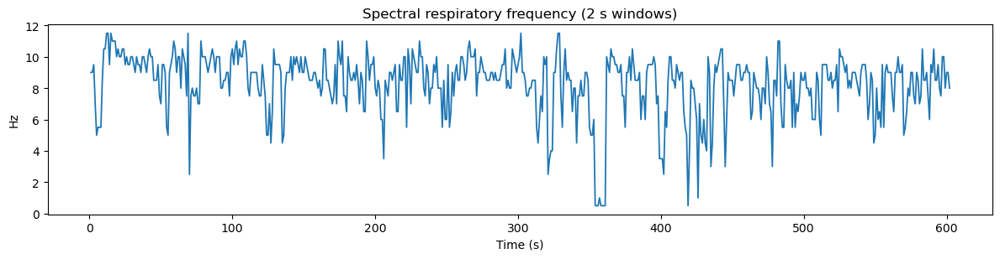

In [30]:
from scipy.signal import spectrogram

sig, Fs = resp_f, fs_ds  # filtered @100 Hz
nper, nover = int(Fs*2.0), int(Fs*1.0)  # 2s windows, 1s overlap
f, tt, Sxx = spectrogram(sig, fs=Fs, nperseg=nper, noverlap=nover,
                         scaling='density', mode='psd')
band = (f >= 0.5) & (f <= 15.0)
dom_freq = f[band][np.argmax(Sxx[band, :], axis=0)]

print("Dominant freq (Hz) p25/med/p75:",
      np.percentile(dom_freq, [25,50,75]).round(2))
plt.figure(figsize=(12,3.2))
plt.plot(tt, dom_freq, lw=1.3)
plt.ylabel("Hz"); plt.xlabel("Time (s)")
plt.title("Spectral respiratory frequency (2 s windows)")
plt.tight_layout(); plt.show()


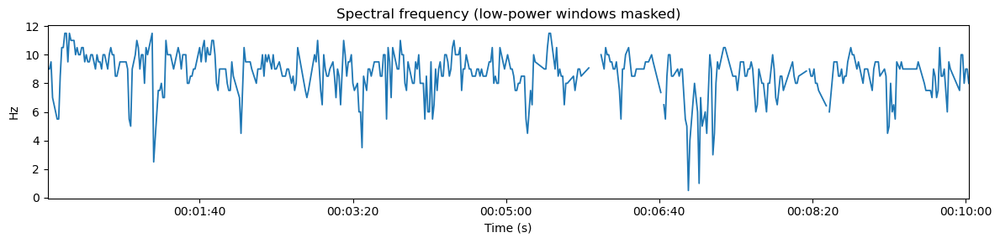

In [42]:
# reuse f, tt, Sxx from your spectrogram (Fs=100, 2 s windows, 1 s overlap)
import numpy as np
band = (f >= 0.5) & (f <= 15.0)

bandpow = Sxx[band, :].sum(axis=0)              # power in resp band
thr = np.percentile(bandpow, 20)                # drop bottom 20% (tweak)
spec_ok = pd.Series(dom_freq, index=pd.to_timedelta(tt, 's'))
mask = bandpow >= thr
spec_ok[~mask] = np.nan                         # set unreliable windows to NaN
spec_ok = spec_ok.interpolate(limit=5)          # small gaps

ax = spec_ok.plot(figsize=(12,3), lw=1.3)
ax.set_ylabel('Hz'); ax.set_xlabel('Time (s)')
ax.set_title('Spectral frequency (low-power windows masked)')
ax.figure.tight_layout()


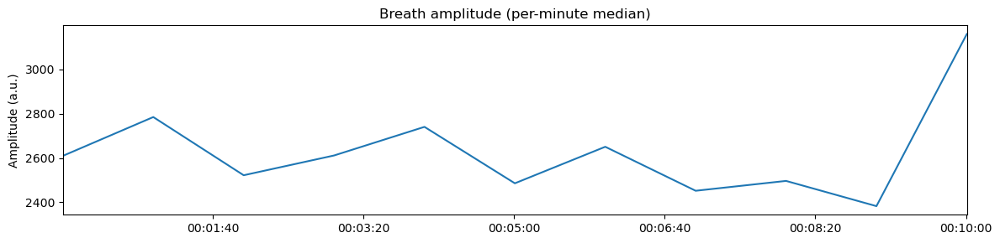

In [33]:
# simple per-breath amplitude: peak-to-trough in 0.4 s after each trough
from scipy.signal import find_peaks

sig, Fs = resp_f, fs_ds
peaks_pos, _ = find_peaks(sig, distance=int(Fs*0.09))
amp = []
t_amp = []
for ti in trough_idx2:
    cand = peaks_pos[(peaks_pos>=ti) & (peaks_pos<ti+int(Fs*0.4))]
    if cand.size:
        pk = cand[np.argmax(sig[cand])]
        amp.append(sig[pk] - sig[ti])
        t_amp.append(pk/Fs)
amp_s = pd.Series(amp, index=pd.to_timedelta(t_amp, 's'))

ax = amp_s.resample('60s').median().plot(figsize=(12,3), lw=1.5)
ax.set_ylabel('Amplitude (a.u.)')
ax.set_title('Breath amplitude (per-minute median)')
ax.figure.tight_layout()


In [48]:
# assumes:
#   amp_s  -> per-breath amplitude Series (index = time, seconds as Timedelta)
#   rate_s -> instantaneous rate Series (same indexing)

# 1) How many breaths per minute contributed to the median?
permin_count = amp_s.resample('60s').count()
print(permin_count)

# 2) Are there big outliers? Look at 10th/90th percentiles per minute
permin_q10 = amp_s.resample('60s').quantile(0.10)
permin_q90 = amp_s.resample('60s').quantile(0.90)

# 3) Robust median if you trim extreme 1% (guards against artifacts)
amp_trim = amp_s.clip(amp_s.quantile(0.01), amp_s.quantile(0.99))
permin_amp_trim = amp_trim.resample('60s').median()


0 days 00:00:00.530000    493
0 days 00:01:00.530000    483
0 days 00:02:00.530000    421
0 days 00:03:00.530000    410
0 days 00:04:00.530000    456
0 days 00:05:00.530000    320
0 days 00:06:00.530000    407
0 days 00:07:00.530000    370
0 days 00:08:00.530000    388
0 days 00:09:00.530000    403
0 days 00:10:00.530000     23
Freq: 60s, dtype: int64


In [34]:
import pandas as pd
import numpy as np

# Assume you already have:
#   spec_s : spectral freq (Hz) indexed by TimedeltaIndex (tt)
#   peak_s : peak-based rate (Hz) indexed by TimedeltaIndex (t_rate2)

# 1) Put both on the same 1-s grid
spec1s = spec_s.resample('1s').median()
peak1s = peak_s.resample('1s').median()

# 2) Fill small holes so empty seconds don't poison corr (tweak limit as needed)
spec1s = spec1s.interpolate('time', limit=2)
peak1s = peak1s.interpolate('time', limit=2)

# 3) Align, drop remaining NaNs
df = pd.concat([peak1s.rename('peak'), spec1s.rename('spec')], axis=1).dropna()

print("Points after align+dropna:", len(df))
print("Remaining NaNs:\n", df.isna().sum())

# 4) Guard against degenerate cases (zero variance or too few points)
if len(df) < 3 or df['peak'].std() == 0 or df['spec'].std() == 0:
    print("Not enough overlapping, non-constant data for correlation.")
else:
    r_pearson  = df['peak'].corr(df['spec'], method='pearson')
    r_spearman = df['peak'].corr(df['spec'], method='spearman')
    print("Pearson r:", round(r_pearson, 3), " | Spearman ρ:", round(r_spearman, 3))


Points after align+dropna: 0
Remaining NaNs:
 peak    0
spec    0
dtype: int64
Not enough overlapping, non-constant data for correlation.


In [35]:
import pandas as pd
import numpy as np

# Make sure both are Timedelta-indexed, sorted, and numeric
spec_s = spec_s.astype(float).sort_index()   # spectral freq @ times tt
peak_s = peak_s.astype(float).sort_index()   # peak-based rate @ times t_rate2

# Nearest match within 0.5 s tolerance
df = pd.merge_asof(
    left=peak_s.to_frame('peak'),
    right=spec_s.to_frame('spec'),
    left_index=True,
    right_index=True,
    direction='nearest',
    tolerance=pd.Timedelta('500ms')
).dropna()

print("Aligned pairs:", len(df))
if len(df) >= 3 and df['peak'].std() > 0 and df['spec'].std() > 0:
    print("Pearson r:", df['peak'].corr(df['spec'], method='pearson'))
    print("Spearman ρ:", df['peak'].corr(df['spec'], method='spearman'))
else:
    print("Not enough overlapping, non-constant data after nearest alignment.")


Aligned pairs: 3611
Pearson r: 0.38010605063194813
Spearman ρ: 0.39454540122306603


Text(0.5, 1.0, 'Rate agreement (aligned pairs)')

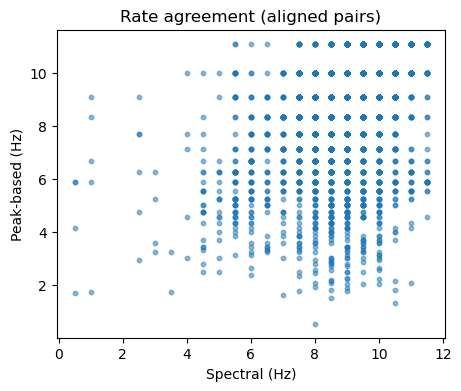

In [36]:
ax = df.plot(kind='scatter', x='spec', y='peak', s=10, alpha=0.5, figsize=(5,4))
ax.set_xlabel("Spectral (Hz)"); ax.set_ylabel("Peak-based (Hz)")
ax.set_title("Rate agreement (aligned pairs)")


In [37]:
# inputs you already have:
# dom_freq (Hz) at times tt (s) from spectrogram (2 s windows, 1 s hop)
# rate_hz2 (Hz) at times t_rate2 (s) from peaks/troughs (strict settings)

import numpy as np, pandas as pd

rate_s = pd.Series(rate_hz2, index=pd.to_timedelta(t_rate2, unit='s'))
tt_td  = pd.to_timedelta(tt, unit='s')

win = 2.0  # seconds (match nperseg/Fs)
half = win/2

peak_on_spec = []
for tc in tt:
    t0 = pd.to_timedelta(tc - half, unit='s')
    t1 = pd.to_timedelta(tc + half, unit='s')
    vals = rate_s.loc[t0:t1]
    peak_on_spec.append(np.nan if len(vals)<2 else np.median(vals))  # need ≥2 breaths

peak_on_spec = pd.Series(peak_on_spec, index=tt_td, name="peak2s")
spec_series  = pd.Series(dom_freq, index=tt_td, name="spec2s")


In [39]:
# Prereqs already in your notebook: resp_f (filtered @100 Hz), fs_ds, rate_hz2, t_rate2
import numpy as np, pandas as pd
from scipy.signal import spectrogram

sig, Fs = resp_f, fs_ds  # filtered signal @100 Hz

# --- Spectral frequency on 2 s windows (1 s overlap) ---
nper = int(Fs*2); nover = int(Fs*1)
f, tt, Sxx = spectrogram(sig, fs=Fs, nperseg=nper, noverlap=nover,
                         scaling='density', mode='psd')
band = (f >= 0.5) & (f <= 15.0)
dom_freq = f[band][np.argmax(Sxx[band, :], axis=0)]
bandpow  = Sxx[band, :].sum(axis=0)

spec_series = pd.Series(dom_freq, index=pd.to_timedelta(tt, unit='s'), name='spec2s')
thr = np.percentile(bandpow, 20)                   # drop low-power windows (tweak if needed)
spec_masked = spec_series.mask(bandpow < thr)      # <-- defines spec_masked

# --- Aggregate peak-based rate into the same 2 s windows (median in [tc-1, tc+1]) ---
rate_s = pd.Series(rate_hz2, index=pd.to_timedelta(t_rate2, unit='s'))
win = 2.0; half = win/2
tt_td = pd.to_timedelta(tt, unit='s')

vals_list = []
for tc in tt:
    t0 = pd.to_timedelta(tc - half, unit='s')
    t1 = pd.to_timedelta(tc + half, unit='s')
    vals = rate_s.loc[t0:t1]
    vals_list.append(np.nan if len(vals) < 2 else float(vals.median()))

peak_on_spec = pd.Series(vals_list, index=tt_td, name="peak2s")

# --- Align, drop NaNs, correlate ---
df = pd.concat([peak_on_spec, spec_masked], axis=1).dropna()
print("Windows kept:", len(df))
if len(df) >= 10 and df.std().min() > 0:
    print("Pearson r:", df.peak2s.corr(df.spec2s))
    print("Spearman ρ:", df.peak2s.corr(df.spec2s, method='spearman'))
else:
    print("Not enough variance/overlap after masking.")


Windows kept: 481
Pearson r: 0.7564493295777235
Spearman ρ: 0.7450459889824849


=== Session Rate Summary ===
n_troughs: 3956
duration_s: 621.14
rate_mean_hz: 7.321293166700598
rate_median_hz: 7.692307692307692
rate_q25_hz: 5.555555555555555
rate_q75_hz: 9.090909090909092
frac_over_6hz: 0.6692793931731985


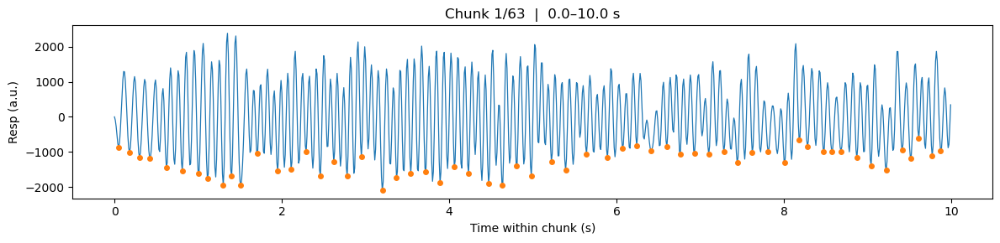

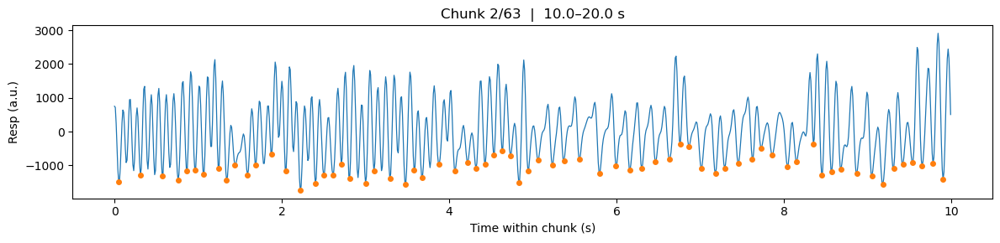

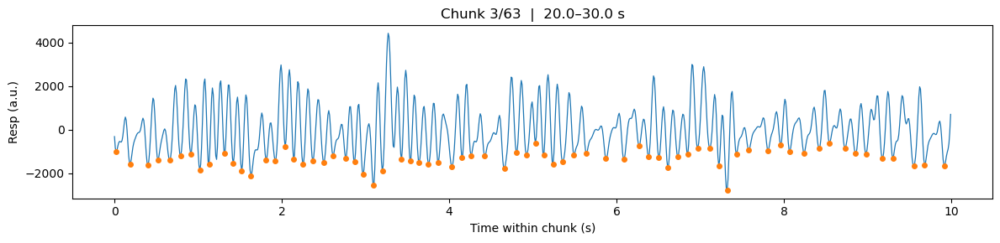

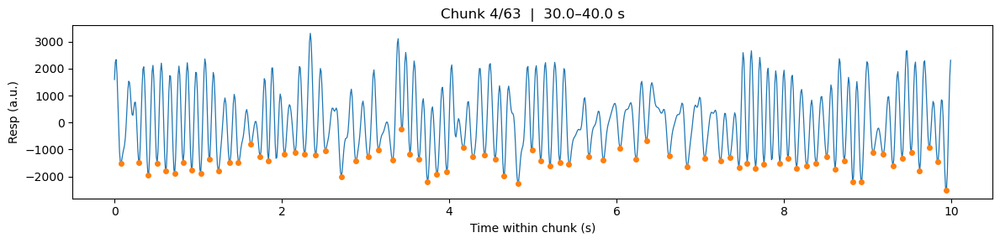

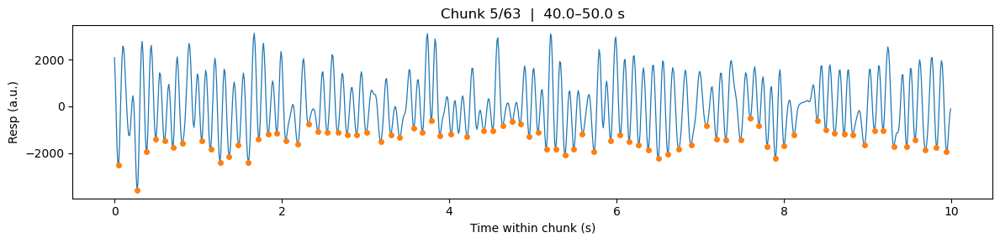

...

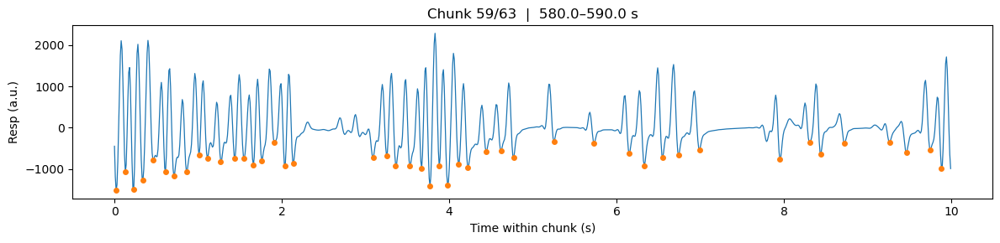

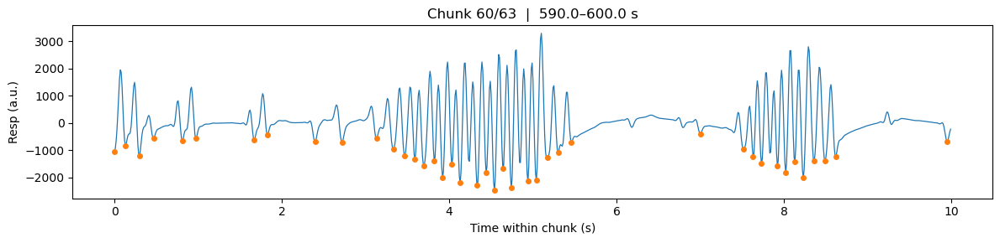

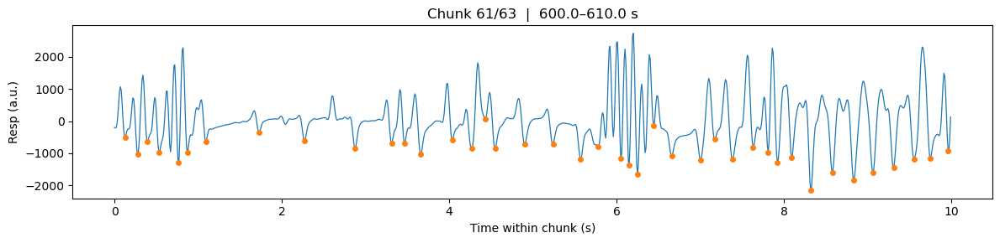

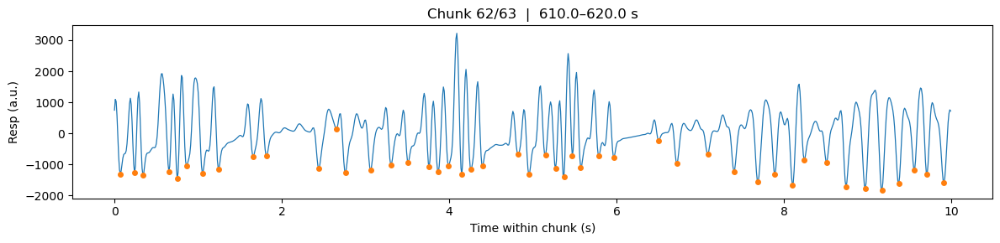

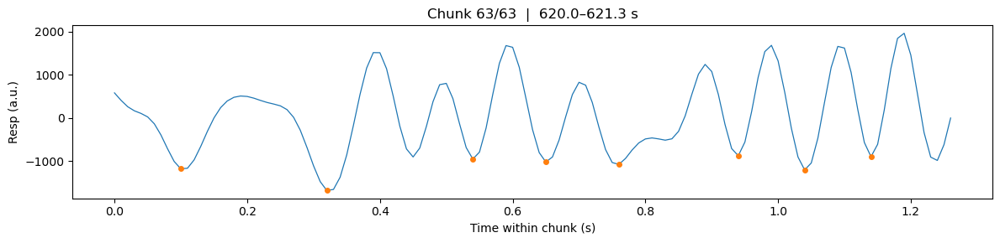

In [47]:
# --- Imports ---
import os, h5py, numpy as np, pandas as pd
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from scipy.signal import butter, filtfilt, resample_poly, find_peaks

# --- Helpers ---
def robust_std(x):
    med = np.median(x)
    return 1.4826 * np.median(np.abs(x - med))

def get_fs_from_h5(f, resp_len=None):
    # Try ekg_metadata.sampling_frequency first (matches your files)
    for grp in ['ekg_metadata','resp_metadata','metadata','info']:
        if grp in f and hasattr(f[grp], 'attrs') and 'sampling_frequency' in f[grp].attrs:
            return float(f[grp].attrs['sampling_frequency'])
    # Fallback via duration
    for grp in ['ekg_metadata','resp_metadata','metadata','info']:
        if grp in f and hasattr(f[grp], 'attrs') and 'duration_sec' in f[grp].attrs and resp_len:
            dur = float(f[grp].attrs['duration_sec'])
            if dur > 0:
                return resp_len / dur
    return None

def preprocess_resp(h5_path, resp_key='resp', target_fs=100.0, anti_alias_hz=40.0, bp_lo=0.5, bp_hi=15.0):
    assert os.path.exists(h5_path), f"Missing file: {h5_path}"
    with h5py.File(h5_path, 'r') as f:
        assert resp_key in f, f"Dataset '{resp_key}' not found."
        raw = np.array(f[resp_key][:], dtype=float).flatten()
        fs = get_fs_from_h5(f, resp_len=len(raw))
    if fs is None:
        raise ValueError("Sampling rate not found in metadata.")

    # Anti-alias LP @ 40 Hz (zero-phase), then downsample to ~100 Hz
    b_lp, a_lp = butter(4, anti_alias_hz/(fs/2), btype='low')
    raw_aa = filtfilt(b_lp, a_lp, raw)
    down = int(round(fs / target_fs))
    sig_ds = resample_poly(raw_aa, up=1, down=down)
    Fs = fs / down

    # Band-pass 0.5–15 Hz (zero-phase)
    b_bp, a_bp = butter(4, [bp_lo/(Fs/2), bp_hi/(Fs/2)], btype='bandpass')
    sig = filtfilt(b_bp, a_bp, sig_ds)

    return sig, Fs

def detect_troughs(sig, Fs, min_dist_s=0.10, prom_scale=0.5, min_width_s=0.03):
    """Detect inhalation troughs on the inverted filtered signal."""
    trough_idx, props = find_peaks(
        -sig,
        distance=int(Fs*min_dist_s),                 # refractory (caps <= ~1/min_dist_s Hz)
        prominence=prom_scale*robust_std(sig),
        width=int(Fs*min_width_s)
    )
    return trough_idx, props

def compute_session_rate(trough_idx, Fs, min_ibi_s=0.05, max_ibi_s=2.0, sniff_thresh_hz=6.0):
    """Return instantaneous rate arrays and session-level summaries."""
    if len(trough_idx) < 3:
        return None

    ibi_s = np.diff(trough_idx) / Fs
    keep = (ibi_s >= min_ibi_s) & (ibi_s <= max_ibi_s)
    ibi_s = ibi_s[keep]
    t_rate_s = trough_idx[1:][keep] / Fs
    rate_hz = 1.0 / ibi_s

    # Session summaries
    session = {
        "n_troughs": int(len(trough_idx)),
        "duration_s": float(trough_idx[-1] / Fs),
        "rate_mean_hz": float(np.mean(rate_hz)),
        "rate_median_hz": float(np.median(rate_hz)),
        "rate_q25_hz": float(np.percentile(rate_hz, 25)),
        "rate_q75_hz": float(np.percentile(rate_hz, 75)),
        "frac_over_6hz": float((rate_hz > sniff_thresh_hz).mean())
    }
    return t_rate_s, rate_hz, session

def plot_session_chunks(sig, Fs, trough_idx=None, chunk_s=10.0, out_pdf=None, show=True):
    """
    Plot the whole session in contiguous chunk_s windows.
    If out_pdf is a filepath, saves all chunks into a single multi-page PDF.
    """
    n = len(sig)
    total_s = n / Fs
    n_chunks = int(np.ceil(total_s / chunk_s))

    pdf = PdfPages(out_pdf) if out_pdf else None
    for k in range(n_chunks):
        t0 = k * chunk_s
        t1 = min((k+1) * chunk_s, total_s)
        i0 = int(t0 * Fs)
        i1 = int(t1 * Fs)
        t_local = np.arange(i1 - i0) / Fs

        plt.figure(figsize=(12, 3))
        plt.plot(t_local, sig[i0:i1], lw=0.9)
        if trough_idx is not None:
            m = (trough_idx >= i0) & (trough_idx < i1)
            if np.any(m):
                plt.plot((trough_idx[m] - i0) / Fs, sig[trough_idx[m]], 'o', ms=4)

        plt.xlabel("Time within chunk (s)")
        plt.ylabel("Resp (a.u.)")
        plt.title(f"Chunk {k+1}/{n_chunks}  |  {t0:.1f}–{t1:.1f} s")
        plt.tight_layout()

        if pdf:
            pdf.savefig()
            plt.close()
        elif show:
            plt.show()
        else:
            plt.close()

    if pdf:
        pdf.close()
        print(f"Saved {n_chunks} chunks to PDF: {out_pdf}")



# Option B (if you already defined your dicts): e.g.,
h5_file = ri1_h5_paths["RI1_1_1"]


# 1) Preprocess
resp_f, fs_ds = preprocess_resp(h5_file)

# 2) Detect breaths and compute session rate
trough_idx2, _ = detect_troughs(resp_f, fs_ds, min_dist_s=0.10, prom_scale=0.5, min_width_s=0.03)
rate_result = compute_session_rate(trough_idx2, fs_ds, min_ibi_s=0.05, max_ibi_s=2.0, sniff_thresh_hz=6.0)

if rate_result is None:
    print("Too few troughs detected.")
else:
    t_rate2_s, rate_hz2, session = rate_result
    print("=== Session Rate Summary ===")
    for k, v in session.items():
        print(f"{k}: {v}")

# 3) Plot whole session in 10-second chunks
#    (A) Show interactively (≈ 60 figures for a ~10 min session):
plot_session_chunks(resp_f, fs_ds, trough_idx=trough_idx2, chunk_s=10.0, out_pdf=None, show=True)

#    (B) Or save as a multi-page PDF instead:
# plot_session_chunks(resp_f, fs_ds, trough_idx=trough_idx2, chunk_s=10.0,
#                     out_pdf="RI1_session_chunks.pdf", show=False)


In [59]:
# --- FIX: per-minute summaries on TimedeltaIndex (no 'origin' needed) ---

import pandas as pd

def zero_anchor(s: pd.Series) -> pd.Series:
    """Shift a TimedeltaIndex Series so it starts at 0 seconds."""
    if len(s.index) == 0:
        return s
    s2 = s.copy()
    s2.index = s2.index - s2.index.min()
    return s2

# Use zero-anchored series for resampling
rate0 = zero_anchor(rate_s)   # rate_s: instantaneous rate (Hz) indexed by Timedelta
amp0  = zero_anchor(amp_s)    # amp_s : per-breath amplitude (a.u.) indexed by Timedelta

# Per-minute summaries
permin_rate = rate0.resample('60s').median()
sniff_occ   = (rate0 > 6.0).resample('60s').mean()

permin_amp   = amp0.resample('60s').median()
permin_count = amp0.resample('60s').count()

# Optional: drop thin/partial minutes for cleaner plots
MIN_COUNT = 200
permin_rate_clean = permin_rate.where(permin_count >= MIN_COUNT)
permin_amp_clean  = permin_amp.where(permin_count >= MIN_COUNT)


In [60]:
import os, h5py, numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt, resample_poly, find_peaks

# small helpers
def robust_std(x):
    med = np.median(x)
    return 1.4826 * np.median(np.abs(x - med))

def zero_anchor(s: pd.Series) -> pd.Series:
    """Shift a TimedeltaIndex Series to start at exactly 0 seconds (avoids pandas resample quirks)."""
    if len(s.index) == 0:
        return s
    s2 = s.copy()
    s2.index = s2.index - s2.index.min()
    return s2


In [61]:
# 👇 change this path to the file you want
h5_file = r"E:\Aim1\AIM1\Day1_new\resp_h5\RI1_s3_6_p5_3_nRB3_20250621_125312_merged.h5"
assert os.path.exists(h5_file), "File not found"

def get_fs_from_h5(h5_path, resp_key='resp'):
    with h5py.File(h5_path, 'r') as f:
        raw = np.array(f[resp_key][:], dtype=float).flatten()
        fs = None
        # prefer ekg_metadata.sampling_frequency
        for grp in ['ekg_metadata','resp_metadata','metadata','info']:
            if grp in f and hasattr(f[grp],'attrs') and 'sampling_frequency' in f[grp].attrs:
                fs = float(f[grp].attrs['sampling_frequency'])
                break
        # fallback via duration
        if fs is None:
            for grp in ['ekg_metadata','resp_metadata','metadata','info']:
                if grp in f and hasattr(f[grp],'attrs') and 'duration_sec' in f[grp].attrs:
                    dur = float(f[grp].attrs['duration_sec'])
                    if dur > 0:
                        fs = len(raw)/dur
                        break
    return raw, fs

raw, fs = get_fs_from_h5(h5_file)
print("len(raw):", len(raw), "| fs:", fs, "Hz", "| duration (s):", len(raw)/fs)


len(raw): 12065446 | fs: 20000.0 Hz | duration (s): 603.2723


In [63]:
# anti-alias low-pass @ 40 Hz (zero-phase), then downsample to 100 Hz, then band-pass 0.5–15 Hz
target_fs = 100.0

# 1) low-pass to prevent aliasing
b_lp, a_lp = butter(4, 40.0/(fs/2), btype='low')
raw_aa = filtfilt(b_lp, a_lp, raw)

# 2) downsample
down = int(round(fs/target_fs))   # e.g., 20000 -> 100 Hz = 200
resp_ds = resample_poly(raw_aa, up=1, down=down)
fs_ds = fs / down

# 3) band-pass 0.5–15 Hz
b_bp, a_bp = butter(4, [0.5/(fs_ds/2), 15.0/(fs_ds/2)], btype='bandpass')
resp_f = filtfilt(b_bp, a_bp, resp_ds)

print("Downsampled fs:", fs_ds, "| samples:", len(resp_f))


Downsampled fs: 100.0 | samples: 60328


In [64]:
# detect inhalation troughs on the inverted, filtered signal
trough_idx, _ = find_peaks(-resp_f,
                           distance=int(fs_ds*0.10),        # ≥ 0.10 s between breaths (≤ ~10 Hz)
                           prominence=0.5*robust_std(resp_f),
                           width=int(fs_ds*0.03))

# instantaneous rate (Hz) from inter-breath intervals (IBI)
ibi = np.diff(trough_idx)/fs_ds
keep = (ibi >= 0.05) & (ibi <= 2.0)    # sensible range
rate_hz = 1.0/ibi[keep]
t_rate  = trough_idx[1:][keep]/fs_ds

# put rate on a time index (seconds) and zero-anchor so resample works
rate_s = pd.Series(rate_hz, index=pd.to_timedelta(t_rate, unit='s')).sort_index()
rate_s = zero_anchor(rate_s)

# quick session summary
session = {
    "duration_s": float(len(resp_f)/fs_ds),
    "n_troughs": int(len(trough_idx)),
    "rate_median_hz": float(np.median(rate_hz)) if len(rate_hz) else np.nan,
    "rate_q25_hz": float(np.percentile(rate_hz, 25)) if len(rate_hz) else np.nan,
    "rate_q75_hz": float(np.percentile(rate_hz, 75)) if len(rate_hz) else np.nan,
    "frac_over_6hz": float((rate_hz>6.0).mean()) if len(rate_hz) else np.nan
}
print(session)


{'duration_s': 603.28, 'n_troughs': 3894, 'rate_median_hz': 8.333333333333334, 'rate_q25_hz': 5.88235294117647, 'rate_q75_hz': 9.090909090909092, 'frac_over_6hz': 0.7160842754367934}


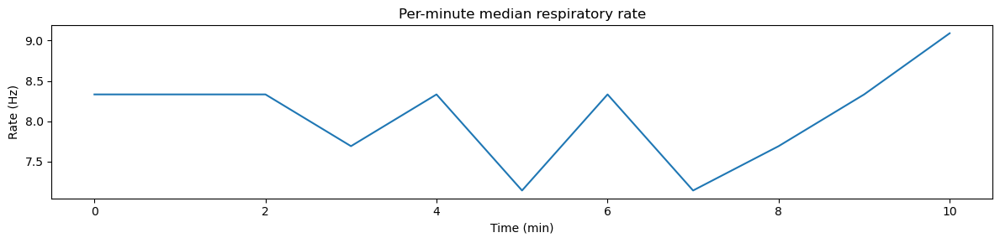

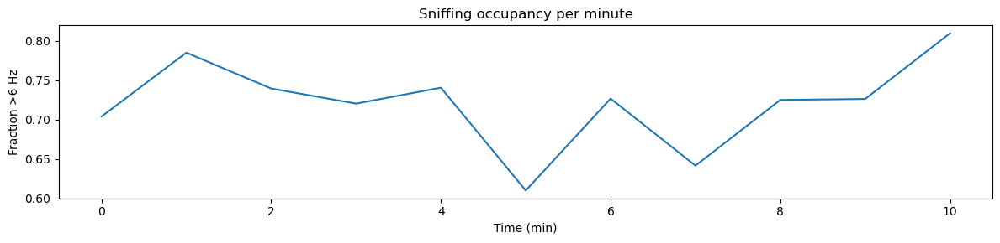

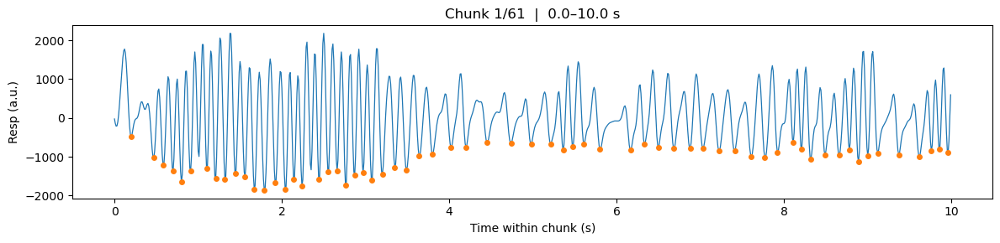

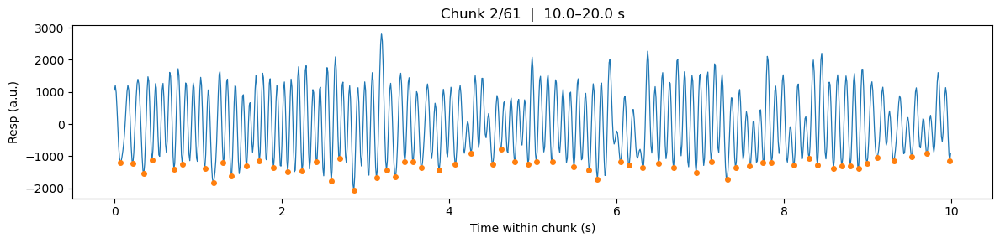

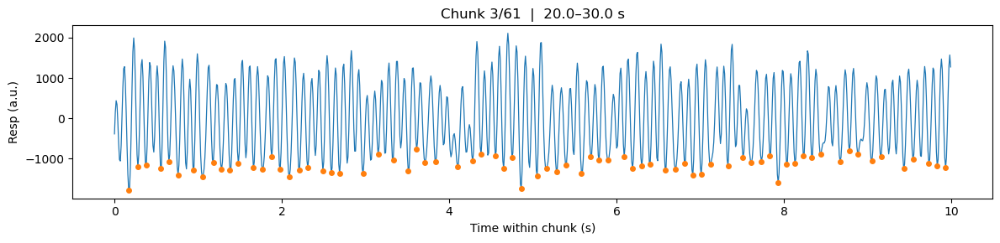

...

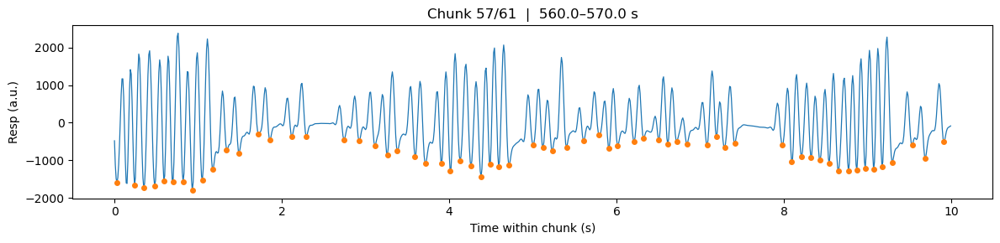

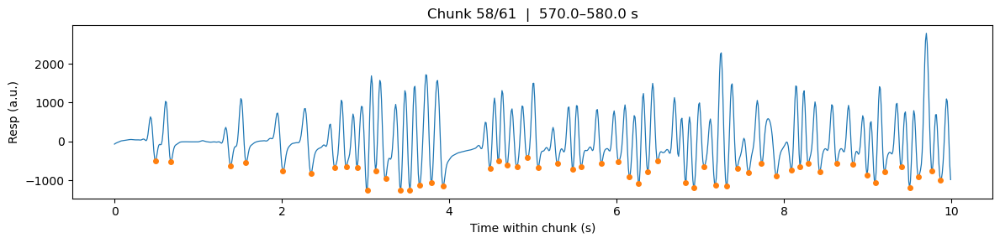

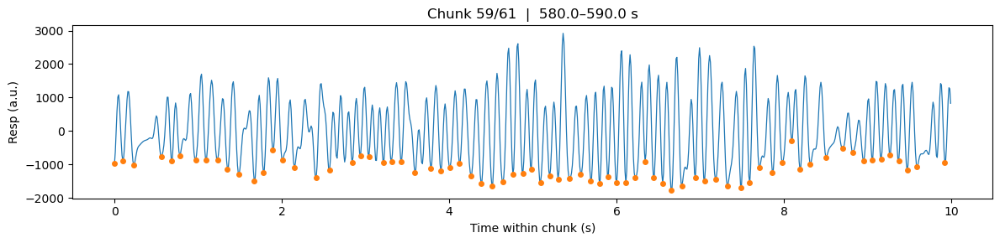

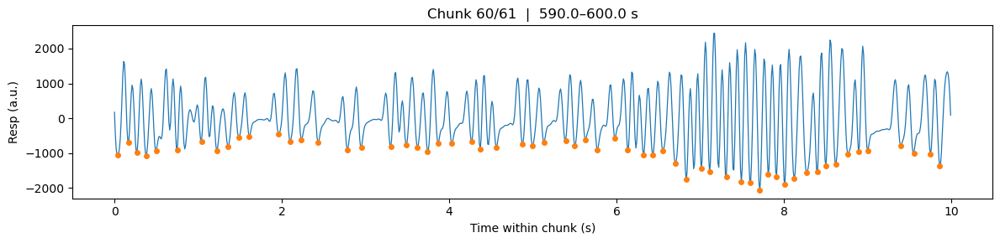

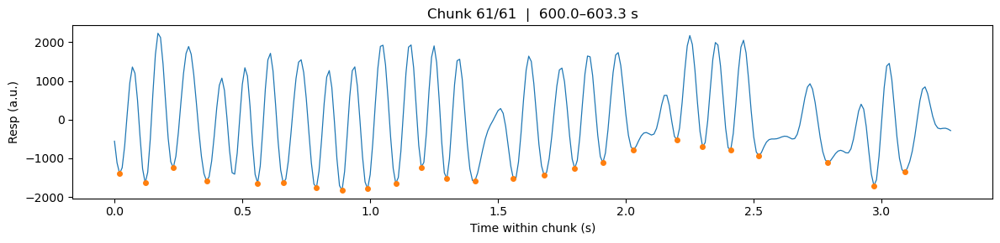

In [65]:
# ---- per-minute rate (median) and % time > 6 Hz ----
permin_rate = rate_s.resample('60s').median()
sniff_occ   = (rate_s > 6.0).resample('60s').mean()

plt.figure(figsize=(12,3))
plt.plot(permin_rate.index.total_seconds()/60, permin_rate.values, lw=1.5)
plt.xlabel("Time (min)"); plt.ylabel("Rate (Hz)")
plt.title("Per-minute median respiratory rate")
plt.tight_layout(); plt.show()

plt.figure(figsize=(12,3))
plt.plot(sniff_occ.index.total_seconds()/60, sniff_occ.values, lw=1.5)
plt.xlabel("Time (min)"); plt.ylabel("Fraction >6 Hz")
plt.title("Sniffing occupancy per minute")
plt.tight_layout(); plt.show()

# ---- whole session in 10-second chunks (with trough markers) ----
def plot_session_chunks(sig, Fs, trough_idx=None, chunk_s=10.0):
    total_s = len(sig)/Fs
    n_chunks = int(np.ceil(total_s/chunk_s))
    for k in range(n_chunks):
        t0 = k*chunk_s
        t1 = min((k+1)*chunk_s, total_s)
        i0 = int(t0*Fs); i1 = int(t1*Fs)
        t_local = np.arange(i1-i0)/Fs

        plt.figure(figsize=(12,3))
        plt.plot(t_local, sig[i0:i1], lw=0.9)
        if trough_idx is not None:
            m = (trough_idx>=i0) & (trough_idx<i1)
            if np.any(m):
                plt.plot((trough_idx[m]-i0)/Fs, sig[trough_idx[m]], 'o', ms=4)
        plt.xlabel("Time within chunk (s)"); plt.ylabel("Resp (a.u.)")
        plt.title(f"Chunk {k+1}/{n_chunks}  |  {t0:.1f}–{t1:.1f} s")
        plt.tight_layout(); plt.show()

plot_session_chunks(resp_f, fs_ds, trough_idx=trough_idx, chunk_s=10.0)


In [66]:
# resp_f = filtered respiration (after LP→downsample→band-pass)
# Inhale is a dip → detect troughs by inverting:
trough_idx, props = find_peaks(-resp_f, distance=Fs*0.10, prominence=0.5*robust_std(resp_f), width=Fs*0.03)

# If in your rig inhale is a bump (upward), detect peaks directly:
peak_idx, props = find_peaks(resp_f,  distance=Fs*0.10, prominence=0.5*robust_std(resp_f), width=Fs*0.03)


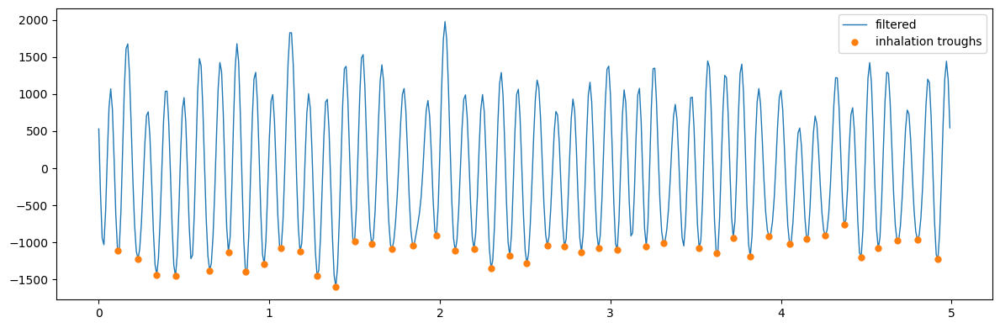

In [67]:
seg_s, dur_s = 30, 5
i0, i1 = int(seg_s*Fs), int((seg_s+dur_s)*Fs)
t_local = np.arange(i1-i0)/Fs
m = (trough_idx>=i0) & (trough_idx<i1)

plt.figure(figsize=(12,4))
plt.plot(t_local, resp_f[i0:i1], lw=1.0, label='filtered')
plt.plot((trough_idx[m]-i0)/Fs, resp_f[trough_idx[m]], 'o', ms=5, label='inhalation troughs')
plt.legend(); plt.tight_layout(); plt.show()


In [68]:
# Use inhalation PEAKS directly (no inversion)
sig, Fs = resp_f, fs_ds  # filtered @100 Hz

from scipy.signal import find_peaks
def robust_std(x):
    import numpy as np
    med = np.median(x)
    return 1.4826 * np.median(np.abs(x - med))

# Detect inhalation peaks
inh_idx, props = find_peaks(
    sig,
    distance=int(Fs*0.10),               # ≥ 0.10 s refractory  → caps ≤ ~10 Hz
    prominence=0.5*robust_std(sig),      # require clear events
    width=int(Fs*0.03)                   # avoid needle spikes
)

# Instantaneous rate from inter-peak intervals (IBIs)
import numpy as np, pandas as pd
ibi = np.diff(inh_idx) / Fs
keep = (ibi >= 0.05) & (ibi <= 2.0)      # plausible range
rate_hz = 1.0 / ibi[keep]
t_rate  = inh_idx[1:][keep] / Fs

rate_s = pd.Series(rate_hz, index=pd.to_timedelta(t_rate, unit='s')).sort_index()


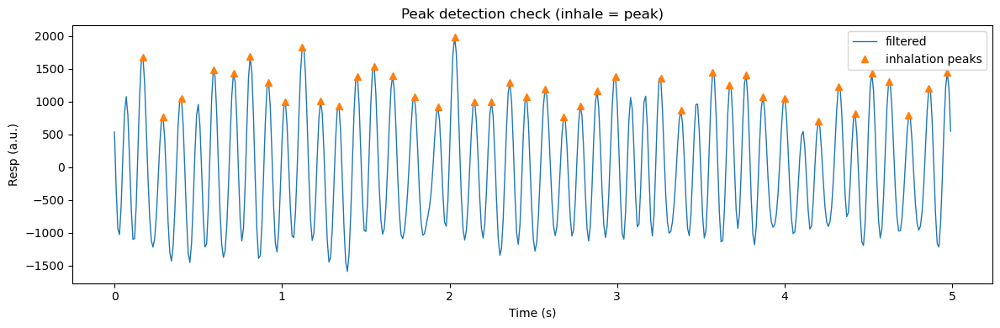

In [69]:
seg_start_s, seg_dur_s = 30, 5
i0, i1 = int(seg_start_s*Fs), int((seg_start_s+seg_dur_s)*Fs)
t_local = np.arange(i1-i0) / Fs
mask = (inh_idx >= i0) & (inh_idx < i1)

import matplotlib.pyplot as plt
plt.figure(figsize=(12,4))
plt.plot(t_local, sig[i0:i1], lw=1.0, label='filtered')
plt.plot((inh_idx[mask]-i0)/Fs, sig[inh_idx[mask]], '^', ms=6, label='inhalation peaks')
plt.xlabel("Time (s)"); plt.ylabel("Resp (a.u.)")
plt.title("Peak detection check (inhale = peak)")
plt.legend(); plt.tight_layout(); plt.show()
